In [ ]:
"""
===================================

        Web Scraping Part

===================================
"""
import csv
import time
import datetime
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.action_chains import ActionChains as Action
from selenium.webdriver.common.desired_capabilities import DesiredCapabilities

In [ ]:
def writeToCSV(data, filename, fields):
    try:
        with open(f"{filename}.csv", "a", newline='') as f:
            writer = csv.DictWriter(f, fieldnames=fields)
            writer.writerows(data)
            print(f"wrote to {filename}.csv")
    except IOError:
        print("error")

def change_city(city):
    active = driver.switch_to.active_element
    active.send_keys(city[0])
    active = driver.switch_to.active_element
    active.send_keys(city[1:], Keys.ENTER)

def change_date(date):
    active = driver.switch_to.active_element
    time.sleep(4)
    active.send_keys(date, Keys.ENTER)
    driver.find_element_by_class_name("WXaAwc").click()

In [ ]:
# set start and end dates
startDate = datetime.datetime(2021, 10, 20) # 2021, 10, 20
endDate = datetime.datetime(2021, 10, 21) # 2022, 3, 31
curDate = startDate

# set cities
cities = ["jeddah", "dammam", "jazan", "medina"]
des = "riyadh"

# create driver
dc = DesiredCapabilities.CHROME
dc['goog:loggingPrefs'] = { 'browser':'INFO' }
path = './chromedriver.exe'
driver = webdriver.Chrome(executable_path=path, desired_capabilities=dc)
url = 'https://www.google.com/travel/flights'

In [ ]:
# start looping in our cities list to web scrap tickets based on the list
for city in cities:
    counter = 0
    while True:
        # go to google flights
        driver.get(url)

        # click in the page to reset active element
        body = driver.find_element_by_tag_name("body")
        body.click()

        # change to One way trip
        body.send_keys(Keys.TAB, Keys.ENTER, Keys.ARROW_DOWN, Keys.ENTER)

        # pick a city
        body.send_keys(Keys.TAB, Keys.TAB, Keys.TAB)
        change_city(city)

        # pick Riyadh
        body.send_keys(Keys.TAB)
        change_city(des)

        # pick a date
        body.send_keys(Keys.TAB)
        change_date(curDate.strftime("%a, %b %#d"))

        time.sleep(4)

        # get all tickets
        getList = driver.find_elements_by_xpath("//div[@role='listitem']")
        getList[-1].click() # expand tickets for more flights tickets
        time.sleep(4) # wait for it to load
        getList = driver.find_elements_by_xpath("//div[@role='listitem']") # get new list
        getList = getList[2:len(getList)-1] # remove first two and last items from list
        print(len(getList))
        tmpList = []
        for item in getList: # loop through tickets
            # locate ticket time location
            times = item.find_element_by_class_name("mv1WYe")
            times = times.find_elements_by_class_name("CrAOse-hSRGPd")
            depaTime = times[0].text[:len(times[0].text)-2] if len(times[0].text) > 8 else times[0].text # get departure time
            arriTime = times[1].text[:len(times[1].text)-2] if len(times[1].text) > 8 else times[1].text # get arrival time

            # locate ticket price location
            price = item.find_elements_by_class_name("FpEdX")[0].text
            airline = item.find_element_by_class_name("TQqf0e").find_element_by_tag_name("span").text # get airline

            # calculate trip duration by subtracting dep from arri time
            if "PM" in depaTime and "AM" in arriTime:
                nextDay = curDate + datetime.timedelta(days=1)
                t1 = datetime.datetime.strptime(curDate.strftime("%a, %b %#d") + " " + depaTime, "%a, %b %d %I:%M %p")
                t2 = datetime.datetime.strptime(nextDay.strftime("%a, %b %#d") + " " + arriTime, "%a, %b %d %I:%M %p")
            else:
                t1 = datetime.datetime.strptime(depaTime, "%I:%M %p")
                t2 = datetime.datetime.strptime(arriTime, "%I:%M %p")
            t3 = t2 - t1
            duration = str(t3)

            # final object of data
            ticketObj = {
                "date": curDate.date(),
                "from": city,
                "to": des,
                "airline": airline,
                "depaTime": depaTime,
                "arriTime": arriTime,
                "duration": duration,
                "price": price
            }
            tmpList.append(ticketObj)
            counter+=1
            print(city + " " + str(counter))
        writeToCSV(tmpList, "testTickets", ["date", "from", "to", "airline", "depaTime", "arriTime", "duration", "price"])
        if curDate >= endDate:
            break
        # advance time by one day
        curDate += datetime.timedelta(days=1)
    curDate = startDate # reset start date for the next city on the list in our loop

In [45]:
"""
===================================

        Analysis Part

===================================
"""
import pandas as pd
import seaborn as sns
import sklearn
import numpy as np
import matplotlib.pyplot as plt 
import datetime
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import Normalizer
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from math import sqrt

pd.options.mode.chained_assignment = None  # default='warn'

sns.set_style("whitegrid", {"font.family": ["serif"]})
sns.set_context("talk") 

%pylab inline
%config InlineBackend.figure_formats = ['retina']

Populating the interactive namespace from numpy and matplotlib


C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning: pylab import has clobbered these variables: ['sqrt']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [46]:
# loading data
ticket_data = pd.read_csv('./tickets.csv')
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price
0,2021-10-20,jeddah,riyadh,flyadeal,4:35 PM,6:15 PM,1:40:00,SAR 230
1,2021-10-20,jeddah,riyadh,flyadeal,6:05 PM,7:45 PM,1:40:00,SAR 230
2,2021-10-20,jeddah,riyadh,Flynas,8:05 PM,9:40 PM,1:35:00,SAR 269
3,2021-10-20,jeddah,riyadh,flyadeal,3:15 AM,4:55 AM,1:40:00,SAR 230
4,2021-10-20,jeddah,riyadh,flyadeal,7:45 AM,9:25 AM,1:40:00,SAR 230
...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,8:05 AM,1:10 PM,5:05:00,SAR 743
121198,2022-03-31,medina,riyadh,Saudia,8:25 AM,2:35 PM,6:10:00,SAR 772
121199,2022-03-31,medina,riyadh,Saudia,11:45 AM,4:35 PM,4:50:00,SAR 772
121200,2022-03-31,medina,riyadh,Saudia,11:45 AM,5:35 PM,5:50:00,SAR 772


In [47]:
#all the columns as ‘object’ data types
# price unavaiable in some rows
ticket_data = ticket_data[ticket_data['price']!= 'Price unavailable']
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price
0,2021-10-20,jeddah,riyadh,flyadeal,4:35 PM,6:15 PM,1:40:00,SAR 230
1,2021-10-20,jeddah,riyadh,flyadeal,6:05 PM,7:45 PM,1:40:00,SAR 230
2,2021-10-20,jeddah,riyadh,Flynas,8:05 PM,9:40 PM,1:35:00,SAR 269
3,2021-10-20,jeddah,riyadh,flyadeal,3:15 AM,4:55 AM,1:40:00,SAR 230
4,2021-10-20,jeddah,riyadh,flyadeal,7:45 AM,9:25 AM,1:40:00,SAR 230
...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,8:05 AM,1:10 PM,5:05:00,SAR 743
121198,2022-03-31,medina,riyadh,Saudia,8:25 AM,2:35 PM,6:10:00,SAR 772
121199,2022-03-31,medina,riyadh,Saudia,11:45 AM,4:35 PM,4:50:00,SAR 772
121200,2022-03-31,medina,riyadh,Saudia,11:45 AM,5:35 PM,5:50:00,SAR 772


In [48]:
# convert date to datetime then sort
ticket_data['date'] = pd.to_datetime(ticket_data.date)
ticket_data.sort_values('date')
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price
0,2021-10-20,jeddah,riyadh,flyadeal,4:35 PM,6:15 PM,1:40:00,SAR 230
1,2021-10-20,jeddah,riyadh,flyadeal,6:05 PM,7:45 PM,1:40:00,SAR 230
2,2021-10-20,jeddah,riyadh,Flynas,8:05 PM,9:40 PM,1:35:00,SAR 269
3,2021-10-20,jeddah,riyadh,flyadeal,3:15 AM,4:55 AM,1:40:00,SAR 230
4,2021-10-20,jeddah,riyadh,flyadeal,7:45 AM,9:25 AM,1:40:00,SAR 230
...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,8:05 AM,1:10 PM,5:05:00,SAR 743
121198,2022-03-31,medina,riyadh,Saudia,8:25 AM,2:35 PM,6:10:00,SAR 772
121199,2022-03-31,medina,riyadh,Saudia,11:45 AM,4:35 PM,4:50:00,SAR 772
121200,2022-03-31,medina,riyadh,Saudia,11:45 AM,5:35 PM,5:50:00,SAR 772


In [49]:
# change format to 24 hours 
ticket_data['depaTime'] = pd.to_datetime(ticket_data['depaTime']).dt.strftime('%H:%M')
ticket_data['arriTime'] = pd.to_datetime(ticket_data['arriTime']).dt.strftime('%H:%M')
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price
0,2021-10-20,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,SAR 230
1,2021-10-20,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,SAR 230
2,2021-10-20,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,SAR 269
3,2021-10-20,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,SAR 230
4,2021-10-20,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,SAR 230
...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,08:05,13:10,5:05:00,SAR 743
121198,2022-03-31,medina,riyadh,Saudia,08:25,14:35,6:10:00,SAR 772
121199,2022-03-31,medina,riyadh,Saudia,11:45,16:35,4:50:00,SAR 772
121200,2022-03-31,medina,riyadh,Saudia,11:45,17:35,5:50:00,SAR 772


In [50]:
ticket_data['airline'].value_counts()

Saudia                       96273
Flynas                        6155
EgyptAir                      3456
Gulf Air                      2911
Royal Jordanian               1507
Emirates                      1459
flydubai, Emirates            1292
Etihad                        1213
Qatar Airways                 1097
flyadeal                       823
Emirates, flydubai             486
MEA                            461
Saudia, Etihad                 313
Turkish Airlines               256
Kuwait Airways                 180
Etihad, Saudia                 162
Oman Air                       150
EgyptAir, Etihad               115
Ethiopian                       61
Royal Jordanian, EgyptAir       12
EgyptAir, Royal Jordanian       11
Saudia, EgyptAir                 7
Royal Jordanian, Saudia          2
Pakistan                         2
Name: airline, dtype: int64

In [51]:
# some flights are added together in one single value
ticket_data.airline = ticket_data.airline.str.split(',')
ticket_data.airline = ticket_data.airline.str[0]
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price
0,2021-10-20,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,SAR 230
1,2021-10-20,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,SAR 230
2,2021-10-20,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,SAR 269
3,2021-10-20,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,SAR 230
4,2021-10-20,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,SAR 230
...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,08:05,13:10,5:05:00,SAR 743
121198,2022-03-31,medina,riyadh,Saudia,08:25,14:35,6:10:00,SAR 772
121199,2022-03-31,medina,riyadh,Saudia,11:45,16:35,4:50:00,SAR 772
121200,2022-03-31,medina,riyadh,Saudia,11:45,17:35,5:50:00,SAR 772


In [52]:
ticket_data['airline'].value_counts()

Saudia              96593
Flynas               6155
EgyptAir             3582
Gulf Air             2911
Emirates             1945
Royal Jordanian      1521
Etihad               1375
flydubai             1292
Qatar Airways        1097
flyadeal              823
MEA                   461
Turkish Airlines      256
Kuwait Airways        180
Oman Air              150
Ethiopian              61
Pakistan                2
Name: airline, dtype: int64

In [53]:
ticket_data.isnull().sum()

date        0
from        0
to          0
airline     0
depaTime    0
arriTime    0
duration    0
price       0
dtype: int64

In [54]:
#no null values

In [55]:
ticket_data['weekday'] = ticket_data['date'].dt.day_name()
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price,weekday
0,2021-10-20,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,SAR 230,Wednesday
1,2021-10-20,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,SAR 230,Wednesday
2,2021-10-20,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,SAR 269,Wednesday
3,2021-10-20,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,SAR 230,Wednesday
4,2021-10-20,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,SAR 230,Wednesday
...,...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,08:05,13:10,5:05:00,SAR 743,Thursday
121198,2022-03-31,medina,riyadh,Saudia,08:25,14:35,6:10:00,SAR 772,Thursday
121199,2022-03-31,medina,riyadh,Saudia,11:45,16:35,4:50:00,SAR 772,Thursday
121200,2022-03-31,medina,riyadh,Saudia,11:45,17:35,5:50:00,SAR 772,Thursday


In [56]:
#duration column has some as -1 day ( need to get rid of that part)
for i,r in ticket_data.iterrows():
    if ',' in str(r['duration']):
        t=str(r['duration']).split(', ')[1]
        ticket_data.at[i, 'duration']=t
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price,weekday
0,2021-10-20,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,SAR 230,Wednesday
1,2021-10-20,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,SAR 230,Wednesday
2,2021-10-20,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,SAR 269,Wednesday
3,2021-10-20,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,SAR 230,Wednesday
4,2021-10-20,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,SAR 230,Wednesday
...,...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,08:05,13:10,5:05:00,SAR 743,Thursday
121198,2022-03-31,medina,riyadh,Saudia,08:25,14:35,6:10:00,SAR 772,Thursday
121199,2022-03-31,medina,riyadh,Saudia,11:45,16:35,4:50:00,SAR 772,Thursday
121200,2022-03-31,medina,riyadh,Saudia,11:45,17:35,5:50:00,SAR 772,Thursday


In [57]:
ticket_data.dtypes

date        datetime64[ns]
from                object
to                  object
airline             object
depaTime            object
arriTime            object
duration            object
price               object
weekday             object
dtype: object

In [58]:
#removing SAR
ticket_data.price=ticket_data.price.str.split(' ')
ticket_data.price=ticket_data.price.str[1]
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price,weekday
0,2021-10-20,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,230,Wednesday
1,2021-10-20,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,230,Wednesday
2,2021-10-20,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,269,Wednesday
3,2021-10-20,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,230,Wednesday
4,2021-10-20,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,230,Wednesday
...,...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,08:05,13:10,5:05:00,743,Thursday
121198,2022-03-31,medina,riyadh,Saudia,08:25,14:35,6:10:00,772,Thursday
121199,2022-03-31,medina,riyadh,Saudia,11:45,16:35,4:50:00,772,Thursday
121200,2022-03-31,medina,riyadh,Saudia,11:45,17:35,5:50:00,772,Thursday


In [59]:
ticket_data['price'] = ticket_data['price'].str.replace(',', '')
ticket_data.price = pd.to_numeric(ticket_data.price, downcast='integer')
ticket_data.dtypes

date        datetime64[ns]
from                object
to                  object
airline             object
depaTime            object
arriTime            object
duration            object
price                int16
weekday             object
dtype: object

In [60]:
ticket_data['bookingDays'] = pd.to_datetime(ticket_data['date'], format="%Y-%m-%d") - pd.Timestamp(2021, 10, 12)
ticket_data['bookingDays'] = (ticket_data['bookingDays'] / np.timedelta64(1, 'D')).astype("int64")
ticket_data

,date,from,to,airline,depaTime,arriTime,duration,price,weekday,bookingDays
0,2021-10-20,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,230,Wednesday,8
1,2021-10-20,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,230,Wednesday,8
2,2021-10-20,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,269,Wednesday,8
3,2021-10-20,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,230,Wednesday,8
4,2021-10-20,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,230,Wednesday,8
...,...,...,...,...,...,...,...,...,...,...
121197,2022-03-31,medina,riyadh,Saudia,08:05,13:10,5:05:00,743,Thursday,170
121198,2022-03-31,medina,riyadh,Saudia,08:25,14:35,6:10:00,772,Thursday,170
121199,2022-03-31,medina,riyadh,Saudia,11:45,16:35,4:50:00,772,Thursday,170
121200,2022-03-31,medina,riyadh,Saudia,11:45,17:35,5:50:00,772,Thursday,170


In [61]:
ticket_data['day'] = pd.to_datetime(ticket_data['date'], format="%Y-%m-%d").dt.day
ticket_data['month'] = pd.to_datetime(ticket_data['date'], format="%Y-%m-%d").dt.month
ticket_data['year'] = pd.to_datetime(ticket_data['date'], format="%Y-%m-%d").dt.year
ticket_data.drop(['date'], axis = 1, inplace = True)
ticket_data

,from,to,airline,depaTime,arriTime,duration,price,weekday,bookingDays,day,month,year
0,jeddah,riyadh,flyadeal,16:35,18:15,1:40:00,230,Wednesday,8,20,10,2021
1,jeddah,riyadh,flyadeal,18:05,19:45,1:40:00,230,Wednesday,8,20,10,2021
2,jeddah,riyadh,Flynas,20:05,21:40,1:35:00,269,Wednesday,8,20,10,2021
3,jeddah,riyadh,flyadeal,03:15,04:55,1:40:00,230,Wednesday,8,20,10,2021
4,jeddah,riyadh,flyadeal,07:45,09:25,1:40:00,230,Wednesday,8,20,10,2021
...,...,...,...,...,...,...,...,...,...,...,...,...
121197,medina,riyadh,Saudia,08:05,13:10,5:05:00,743,Thursday,170,31,3,2022
121198,medina,riyadh,Saudia,08:25,14:35,6:10:00,772,Thursday,170,31,3,2022
121199,medina,riyadh,Saudia,11:45,16:35,4:50:00,772,Thursday,170,31,3,2022
121200,medina,riyadh,Saudia,11:45,17:35,5:50:00,772,Thursday,170,31,3,2022


In [62]:
ticket_data['depaHour'] = pd.to_datetime(ticket_data['depaTime'], format= '%H:%M').dt.hour
ticket_data['depaMinute'] = pd.to_datetime(ticket_data['depaTime'], format= '%H:%M').dt.minute
ticket_data.drop(['depaTime'], axis = 1, inplace = True)
ticket_data['arriHour'] = pd.to_datetime(ticket_data['arriTime'], format= '%H:%M').dt.hour
ticket_data['arriMinute'] = pd.to_datetime(ticket_data['arriTime'], format= '%H:%M').dt.minute
ticket_data.drop(['arriTime'], axis = 1, inplace = True)
ticket_data

,from,to,airline,duration,price,weekday,bookingDays,day,month,year,depaHour,depaMinute,arriHour,arriMinute
0,jeddah,riyadh,flyadeal,1:40:00,230,Wednesday,8,20,10,2021,16,35,18,15
1,jeddah,riyadh,flyadeal,1:40:00,230,Wednesday,8,20,10,2021,18,5,19,45
2,jeddah,riyadh,Flynas,1:35:00,269,Wednesday,8,20,10,2021,20,5,21,40
3,jeddah,riyadh,flyadeal,1:40:00,230,Wednesday,8,20,10,2021,3,15,4,55
4,jeddah,riyadh,flyadeal,1:40:00,230,Wednesday,8,20,10,2021,7,45,9,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121197,medina,riyadh,Saudia,5:05:00,743,Thursday,170,31,3,2022,8,5,13,10
121198,medina,riyadh,Saudia,6:10:00,772,Thursday,170,31,3,2022,8,25,14,35
121199,medina,riyadh,Saudia,4:50:00,772,Thursday,170,31,3,2022,11,45,16,35
121200,medina,riyadh,Saudia,5:50:00,772,Thursday,170,31,3,2022,11,45,17,35


In [63]:
ticket_data['durationHour'] = pd.to_datetime(ticket_data['duration'], format= '%H:%M:%S').dt.hour
ticket_data['durationMinute'] = pd.to_datetime(ticket_data['duration'], format= '%H:%M:%S').dt.minute
ticket_data.drop(['duration'], axis = 1, inplace = True)
ticket_data

,from,to,airline,price,weekday,bookingDays,day,month,year,depaHour,depaMinute,arriHour,arriMinute,durationHour,durationMinute
0,jeddah,riyadh,flyadeal,230,Wednesday,8,20,10,2021,16,35,18,15,1,40
1,jeddah,riyadh,flyadeal,230,Wednesday,8,20,10,2021,18,5,19,45,1,40
2,jeddah,riyadh,Flynas,269,Wednesday,8,20,10,2021,20,5,21,40,1,35
3,jeddah,riyadh,flyadeal,230,Wednesday,8,20,10,2021,3,15,4,55,1,40
4,jeddah,riyadh,flyadeal,230,Wednesday,8,20,10,2021,7,45,9,25,1,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121197,medina,riyadh,Saudia,743,Thursday,170,31,3,2022,8,5,13,10,5,5
121198,medina,riyadh,Saudia,772,Thursday,170,31,3,2022,8,25,14,35,6,10
121199,medina,riyadh,Saudia,772,Thursday,170,31,3,2022,11,45,16,35,4,50
121200,medina,riyadh,Saudia,772,Thursday,170,31,3,2022,11,45,17,35,5,50


In [64]:
ticket_data = ticket_data[ticket_data['durationHour'] < 2]
ticket_data = ticket_data[ticket_data['price'] < 3000]
ticket_data.drop(['year', 'day', 'month', 'depaMinute', 'arriMinute', 'arriHour'], axis = 1, inplace = True)
ticket_data['durationMin'] = ticket_data['durationMinute'].astype('int64') + (ticket_data['durationHour'].astype('int64') * 60)
ticket_data.drop(['durationMinute', 'durationHour'], axis = 1, inplace = True)
ticket_data

,from,to,airline,price,weekday,bookingDays,depaHour,durationMin
0,jeddah,riyadh,flyadeal,230,Wednesday,8,16,100
1,jeddah,riyadh,flyadeal,230,Wednesday,8,18,100
2,jeddah,riyadh,Flynas,269,Wednesday,8,20,95
3,jeddah,riyadh,flyadeal,230,Wednesday,8,3,100
4,jeddah,riyadh,flyadeal,230,Wednesday,8,7,100
...,...,...,...,...,...,...,...,...
121178,medina,riyadh,Saudia,395,Thursday,170,1,85
121179,medina,riyadh,Saudia,395,Thursday,170,5,80
121180,medina,riyadh,Saudia,395,Thursday,170,9,80
121181,medina,riyadh,Saudia,395,Thursday,170,18,80


In [65]:
ticket_data.describe()

,price,bookingDays,depaHour,durationMin
count,18481.000000,18481.000000,18481.000000,18481.000000
mean,584.254856,85.837996,14.078567,78.285482
std,329.644764,46.299886,6.791658,29.270523
min,144.000000,8.000000,0.000000,0.000000
25%,310.000000,46.000000,9.000000,65.000000
50%,509.000000,84.000000,15.000000,95.000000
75%,736.000000,126.000000,20.000000,100.000000
max,2999.000000,170.000000,23.000000,115.000000


<AxesSubplot:xlabel='price', ylabel='weekday'>

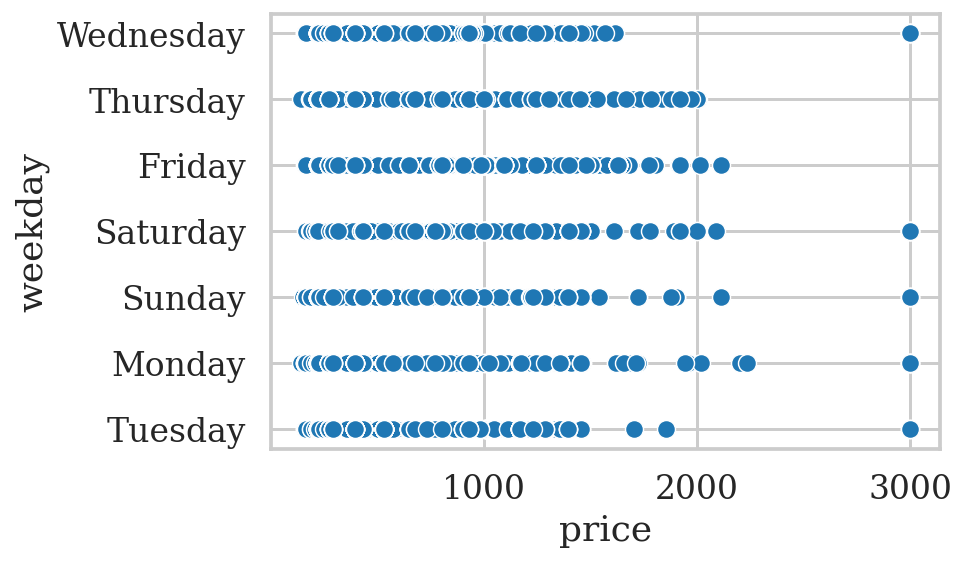

In [66]:
sns.scatterplot(x = 'price', y = 'weekday', data = ticket_data)

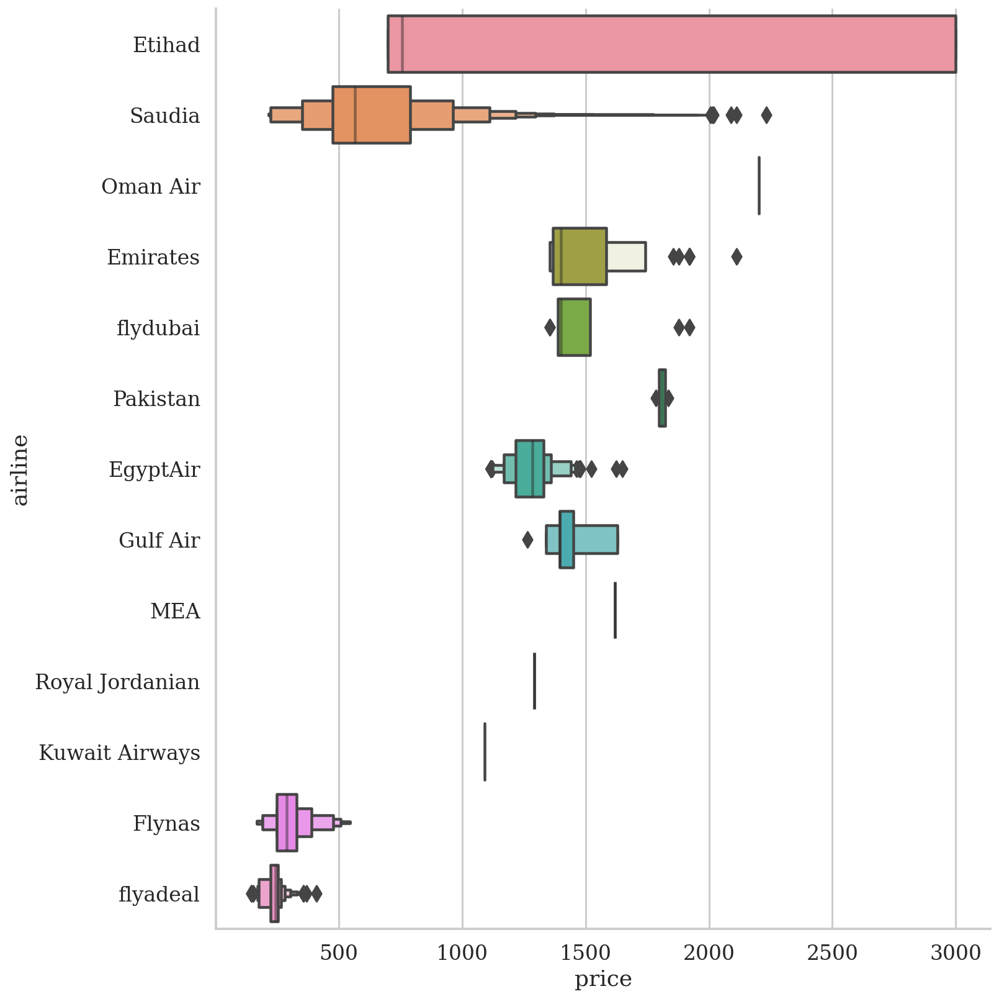

In [67]:
f1 = sns.catplot(y = 'airline', x = 'price', data = ticket_data.sort_values('price', ascending = False), kind = 'boxen', height = 11, aspect = 1)

In [70]:
filter_list = ['Turkish Airlines', 'Kuwait Airways', 'Oman Air', 'Ethiopian', 'Pakistan', 'flydubai', 'Royal Jordanian', 'MEA', 'Emirates']
for i, r in ticket_data.iterrows():
    if str(r['airline']) in filter_list:
        ticket_data.at[i, 'airline'] = 'Other'
        
ticket_data['airline'].value_counts()

Saudia      13282
Flynas       3568
flyadeal      823
EgyptAir      490
Gulf Air      131
Etihad        116
Other          71
Name: airline, dtype: int64

In [71]:
ticket_data.corr()

,price,bookingDays,depaHour,durationMin
price,1.000000,0.008267,0.263230,-0.348958
bookingDays,0.008267,1.000000,-0.007990,-0.006055
depaHour,0.263230,-0.007990,1.000000,-0.119139
durationMin,-0.348958,-0.006055,-0.119139,1.000000


In [72]:
weekdays = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday']
weekends = ['Friday', 'Saturday']

for i,r in ticket_data.iterrows():
    if str(r['weekday']) in weekdays:
        ticket_data.at[i, 'isWeekend']= 'False'
    else:
        ticket_data.at[i, 'isWeekend']= 'True'
ticket_data

,from,to,airline,price,weekday,bookingDays,depaHour,durationMin,isWeekend
0,jeddah,riyadh,flyadeal,230,Wednesday,8,16,100,False
1,jeddah,riyadh,flyadeal,230,Wednesday,8,18,100,False
2,jeddah,riyadh,Flynas,269,Wednesday,8,20,95,False
3,jeddah,riyadh,flyadeal,230,Wednesday,8,3,100,False
4,jeddah,riyadh,flyadeal,230,Wednesday,8,7,100,False
...,...,...,...,...,...,...,...,...,...
121178,medina,riyadh,Saudia,395,Thursday,170,1,85,False
121179,medina,riyadh,Saudia,395,Thursday,170,5,80,False
121180,medina,riyadh,Saudia,395,Thursday,170,9,80,False
121181,medina,riyadh,Saudia,395,Thursday,170,18,80,False


In [73]:
airline = ticket_data[['airline']]
airline = pd.get_dummies(airline, drop_first = True)
source =  ticket_data[['from']]
source = pd.get_dummies(source, drop_first = True)
dest = ticket_data[['to']]
dest = pd.get_dummies(dest, drop_first = True)
weekd = ticket_data[['isWeekend']]
weekd = pd.get_dummies(weekd, drop_first = True)
final_data = pd.concat([ticket_data, airline, source, dest, weekd], axis = 1)
final_data.drop(['airline', 'from', 'to', 'isWeekend', 'weekday'], axis = 1, inplace = True)
final_data

,price,bookingDays,depaHour,durationMin,airline_Etihad,airline_Flynas,airline_Gulf Air,airline_Other,airline_Saudia,airline_flyadeal,from_jazan,from_jeddah,from_medina,isWeekend_True
0,230,8,16,100,0,0,0,0,0,1,0,1,0,0
1,230,8,18,100,0,0,0,0,0,1,0,1,0,0
2,269,8,20,95,0,1,0,0,0,0,0,1,0,0
3,230,8,3,100,0,0,0,0,0,1,0,1,0,0
4,230,8,7,100,0,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121178,395,170,1,85,0,0,0,0,1,0,0,0,1,0
121179,395,170,5,80,0,0,0,0,1,0,0,0,1,0
121180,395,170,9,80,0,0,0,0,1,0,0,0,1,0
121181,395,170,18,80,0,0,0,0,1,0,0,0,1,0


In [74]:
final_data_nor = Normalizer().fit_transform(final_data)
final_data_nor

array([[0.91473168, 0.03181675, 0.06363351, ..., 0.00397709, 0.        ,
        0.        ],
       [0.91424015, 0.03179966, 0.07154923, ..., 0.00397496, 0.        ,
        0.        ],
       [0.94023764, 0.02796246, 0.06990614, ..., 0.00349531, 0.        ,
        0.        ],
       ...,
       [0.90285302, 0.38856965, 0.02057133, ..., 0.        , 0.0022857 ,
        0.        ],
       [0.90228046, 0.38832323, 0.04111658, ..., 0.        , 0.00228425,
        0.        ],
       [0.90200517, 0.38820476, 0.04795471, ..., 0.        , 0.00228356,
        0.        ]])

In [75]:
final_data_nor.shape[1]

14

<AxesSubplot:>

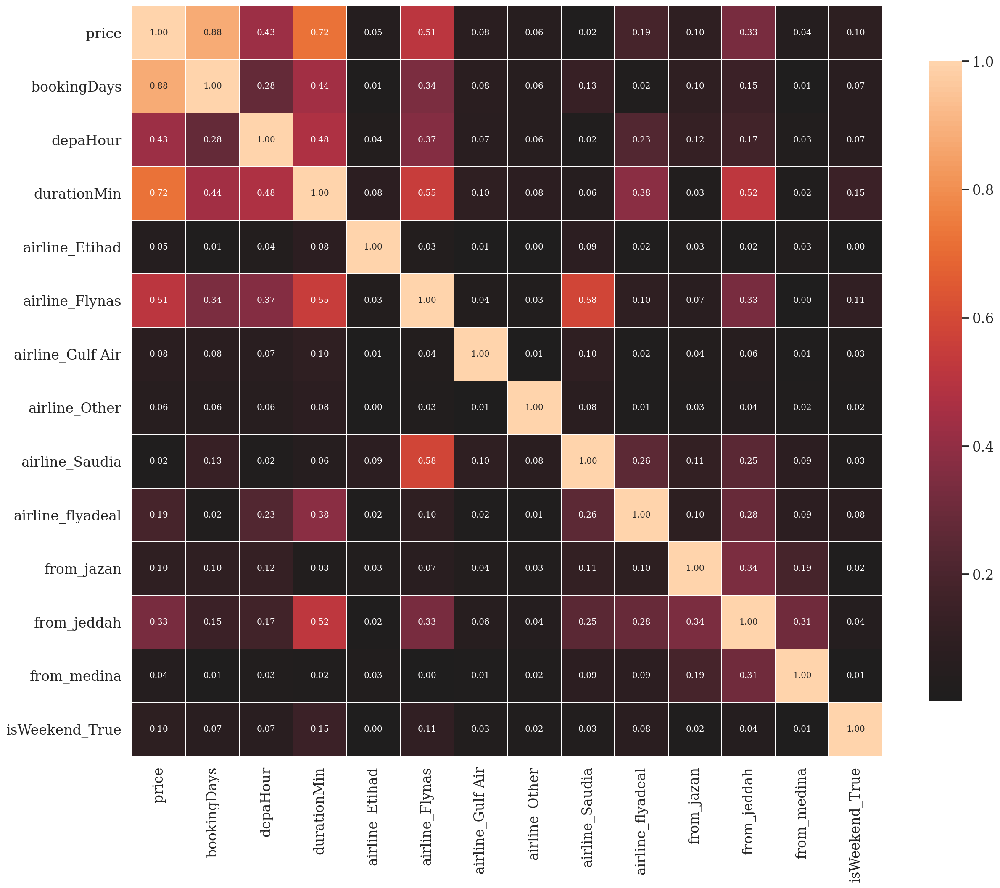

In [77]:
final_df = pd.DataFrame(final_data_nor, columns = final_data.columns)
corr = final_df.corr(method='pearson').abs()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corr, vmax=1.0, center=0, fmt='.2f', square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})

In [31]:
final_df= final_df[['price','bookingDays', 'depaHour', 'durationMin', 'airline_Flynas', 'from_jeddah']]
final_df

,price,bookingDays,depaHour,durationMin,airline_Flynas,from_jeddah
0,0.914732,0.031817,0.063634,0.397709,0.000000,0.003977
1,0.914240,0.031800,0.071549,0.397496,0.000000,0.003975
2,0.940238,0.027962,0.069906,0.332054,0.003495,0.003495
3,0.916524,0.031879,0.011955,0.398489,0.000000,0.003985
4,0.916233,0.031869,0.027885,0.398362,0.000000,0.003984
...,...,...,...,...,...,...
18476,0.901101,0.387816,0.002281,0.193908,0.000000,0.000000
18477,0.902985,0.388627,0.011430,0.182883,0.000000,0.000000
18478,0.902853,0.388570,0.020571,0.182856,0.000000,0.000000
18479,0.902280,0.388323,0.041117,0.182740,0.000000,0.000000


<AxesSubplot:>

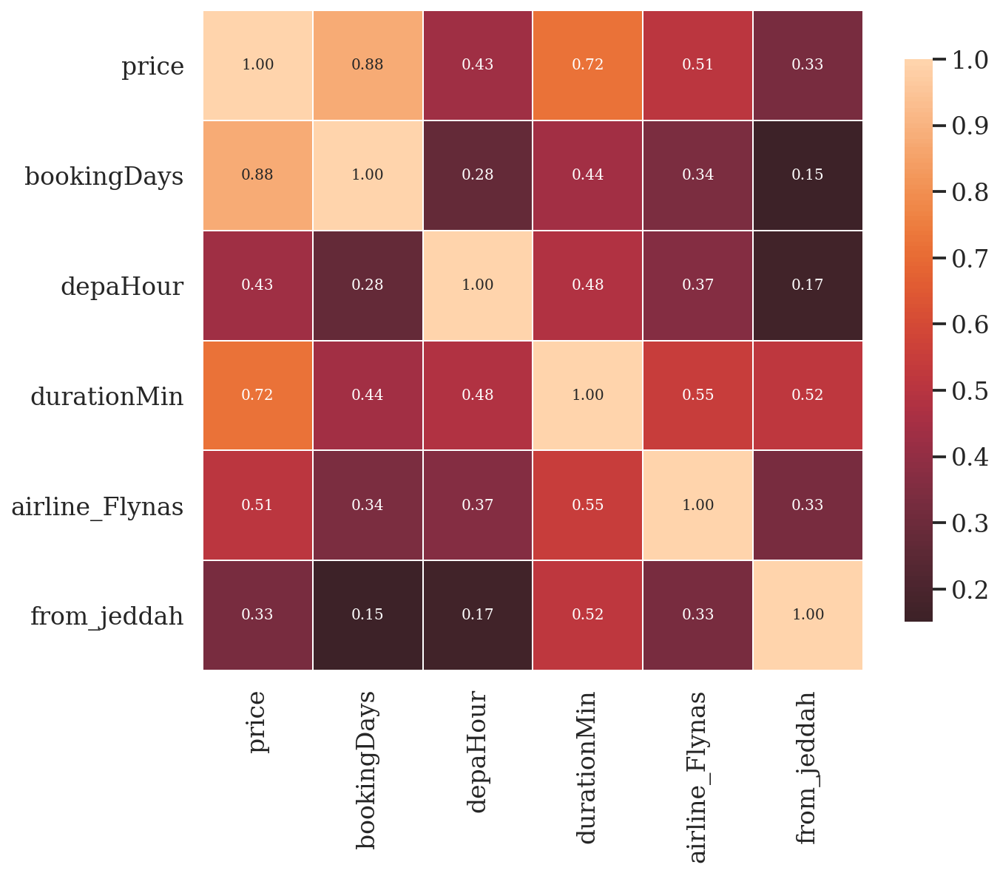

In [32]:
corr = final_df.corr(method='pearson').abs()
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(corr, vmax=1.0, center=0, fmt='.2f', square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})

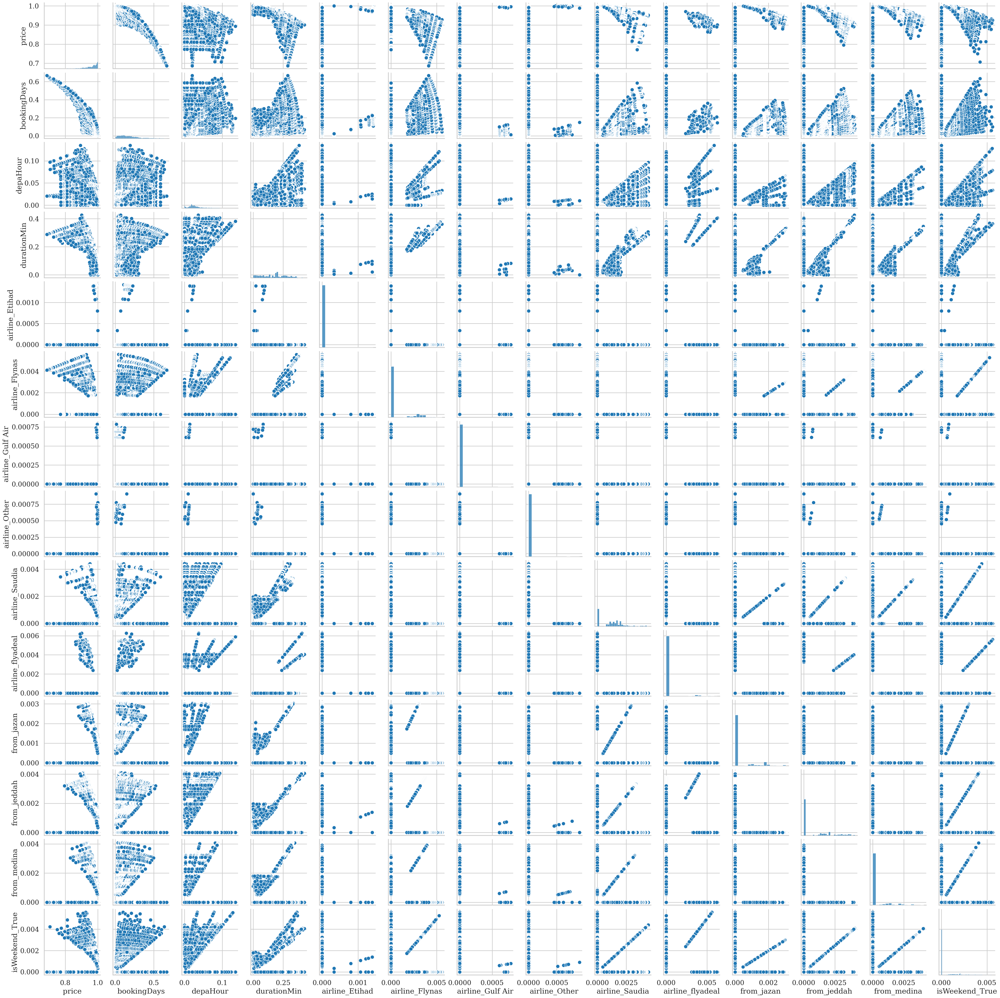

In [78]:
sns.pairplot(final_df)

In [79]:
# Xdf = final_df.drop('price', axis = 1)
Xdf = final_df[['bookingDays', 'depaHour', 'durationMin', 'airline_Flynas', 'from_jeddah']]
ydf = final_df['price']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

X, X_test, y, y_test = train_test_split(Xdf, ydf, test_size = 0.2, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [80]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr.score(X_train,y_train)

0.9124965581835256

In [81]:
pd.DataFrame(lr.coef_, X.columns, columns = ['COEFF'])

,COEFF
bookingDays,-0.253283
depaHour,-0.112784
durationMin,-0.159780
airline_Flynas,-2.081832
from_jeddah,-0.716958


In [82]:
predictions = lr.predict(X_test)

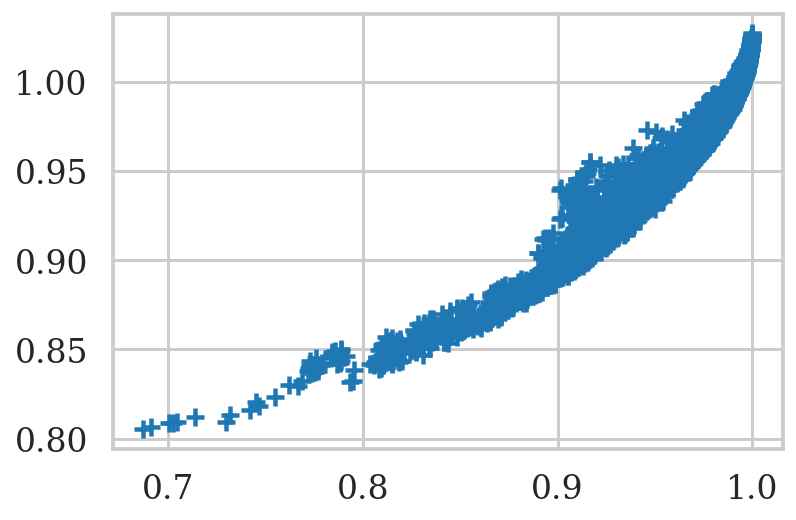

In [83]:
plt.scatter(y_test, predictions, marker='+')

(array([5.000e+00, 1.000e+00, 2.000e+00, 2.200e+01, 9.000e+00, 4.300e+01,
        1.710e+02, 7.730e+02, 1.392e+03, 1.279e+03]),
 array([-0.1182695 , -0.1043105 , -0.09035149, -0.07639248, -0.06243347,
        -0.04847446, -0.03451545, -0.02055644, -0.00659744,  0.00736157,
         0.02132058]),
 <BarContainer object of 10 artists>)

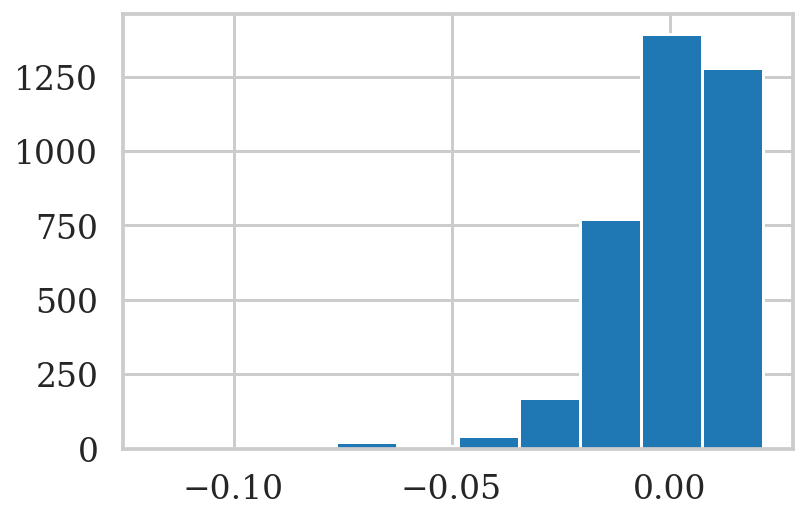

In [84]:
plt.hist(y_test - predictions)

In [85]:
mean_squared_error(y_test, predictions)

0.00020081389535547644

In [92]:
poly = PolynomialFeatures(degree=2)

X_train_poly = poly.fit_transform(X_train)
X_val_poly = poly.transform(X_val)
X_test_poly = poly.transform(X_test)

# Fit a model using polynomial features
lr_poly = LinearRegression()
lr_poly.fit(X_train_poly,y_train)
lr_poly.score(X_train_poly,y_train)

Polynomial Score:  0.9997476598895741


In [87]:
predictions = lr_poly.predict(X_test_poly)

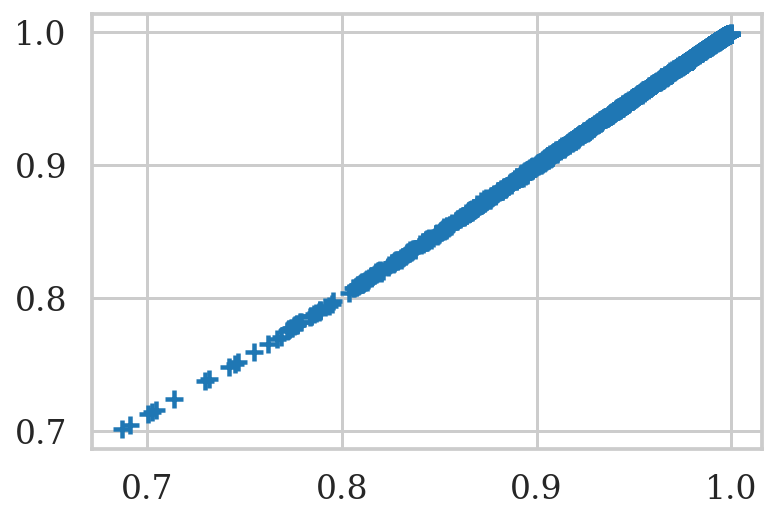

In [88]:
plt.scatter(y_test, predictions, marker='+')

(array([2.000e+00, 3.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 3.000e+00,
        1.700e+01, 7.900e+01, 3.065e+03, 5.250e+02]),
 array([-0.01438741, -0.01270882, -0.01103023, -0.00935164, -0.00767305,
        -0.00599446, -0.00431587, -0.00263728, -0.00095868,  0.00071991,
         0.0023985 ]),
 <BarContainer object of 10 artists>)

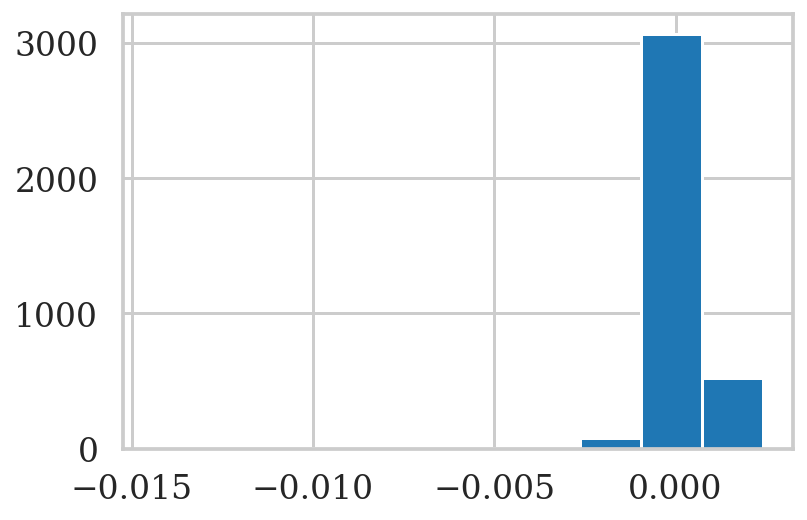

In [89]:
plt.hist(y_test - predictions)

In [90]:
mean_squared_error(y_test, predictions)

7.238691009300055e-07

In [93]:
print('Polynomial Score: ', lr_poly.score(X_train_poly,y_train))
print('Mean Squared Error: ', mean_squared_error(y_test, predictions))

Polynomial Score:  0.9997476598895741
Mean Squared Error:  7.238691009300055e-07


In [61]:
xdf = final_df.drop('price', axis = 1)
ydf = final_df['price']
X, X_test, y, y_test = train_test_split(xdf, ydf, test_size = 0.2, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [62]:
# Fit a simple linear regression on training set
lr = LinearRegression()
lr.fit(X_train,y_train)
lr.score(X_train,y_train)

0.9124965581835256

In [63]:
# Score on validation set
lr.score(X_val,y_val)

0.9119456287729542

In [64]:
# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)

# Apply polynomial transformation to val set
X_val_poly = poly.transform(X_val)

# Fit a model using polynomial features
lr_poly = LinearRegression()
lr_poly.fit(X_train_poly,y_train)
lr_poly.score(X_train_poly,y_train)

0.9997476598895741

In [65]:
# Score on validation set
lr_poly.score(X_val_poly, y_val)

0.9997355151368436

In [66]:
poly.get_feature_names()

['1',
 'x0',
 'x1',
 'x2',
 'x3',
 'x4',
 'x0^2',
 'x0 x1',
 'x0 x2',
 'x0 x3',
 'x0 x4',
 'x1^2',
 'x1 x2',
 'x1 x3',
 'x1 x4',
 'x2^2',
 'x2 x3',
 'x2 x4',
 'x3^2',
 'x3 x4',
 'x4^2']

In [67]:
lr_poly.coef_

array([ 0.00000000e+00,  2.65146289e-02,  7.11603629e-03,  7.44724952e-03,
        1.48395865e+00,  4.01183738e-02, -6.01683968e-01, -1.44880838e-02,
       -5.01437620e-03, -1.60192432e+00,  4.24577852e-01, -5.65685422e-01,
       -1.13347075e-02,  1.72045510e+00, -6.19855651e-01, -5.36533030e-01,
       -4.46292938e+00, -1.02861898e-01, -2.54454691e+00,  9.09314264e+01,
       -7.58862888e+01])

In [68]:
# Compare the actual y values in the training set with the predicted values
y_actual_train = y_train
y_predicted_train = lr.predict(X_train)
y_predicted_train.shape

(11088,)

In [69]:
# Check the RMSE (root mean squared error) on the training data
sqrt(mean_squared_error(y_actual_train, y_predicted_train))

0.013558182452192969

In [70]:
# Compare the actual y values in the test set with the predicted values
y_actual_test = y_test
y_predicted_test = lr.predict(X_test)
y_predicted_test.shape

(3697,)

In [71]:
# Check the RMSE (root mean squared error) on the test data
sqrt(mean_squared_error(y_actual_test, y_predicted_test))

0.014170881954044937

In [72]:
X_test

,bookingDays,depaHour,durationMin,airline_Flynas,from_jeddah
3652,0.119037,0.031326,0.070482,0.0,0.001566
9425,0.298567,0.028630,0.265847,0.0,0.000000
1157,0.042761,0.014745,0.066353,0.0,0.001475
17936,0.187629,0.023784,0.019820,0.0,0.000000
6228,0.203047,0.024427,0.022900,0.0,0.001527
...,...,...,...,...,...
15940,0.135363,0.015740,0.267579,0.0,0.000000
10782,0.374688,0.054344,0.185914,0.0,0.000000
17047,0.080753,0.018315,0.091576,0.0,0.000000
1092,0.057784,0.035083,0.206370,0.0,0.002064


In [73]:
np.random.seed(123)
n = 20
df = pd.DataFrame({"c_1":np.random.random(n), 
                   "c_2":np.zeros(n), 
                   "c_3":2 * np.random.random(n) - .5, 
                   "c_4":np.zeros(n)})
df.c_2 = 2 * df.c_1 - 3 * np.random.random(n)
df.c_4 = 3 * df.c_3 - 2 * np.random.random(n)        

#reformat the data for plotting...
df_plot = df[["c_1", "c_2"]].copy()
df_plot["cat"] = "set1" 
df_temp = df[["c_3", "c_4"]].copy()
df_temp.columns = ["c_1", "c_2"]
df_temp["cat"] = "set2" 
df_plot = df_plot.append(df_temp)

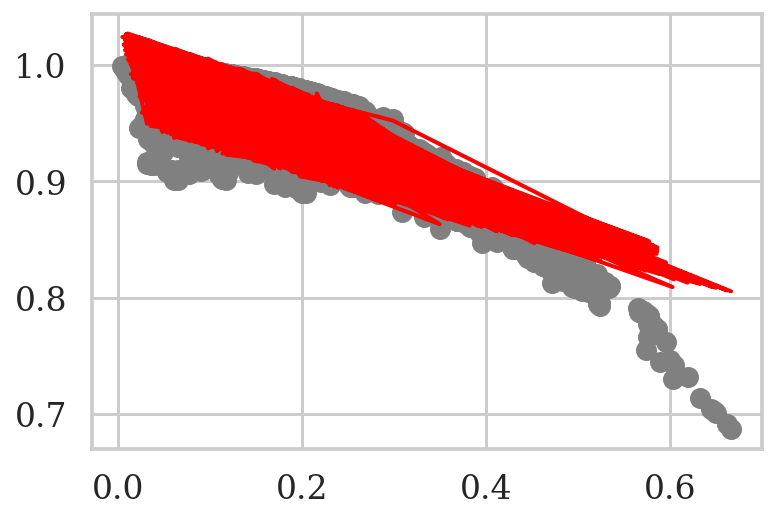

In [74]:
# sns.regplot(data=df_plot, x='c_1', y='c_2', scatter=False)
# sns.scatterplot(data=df_plot, x="c_1", y="c_2", hue="cat")
plt.scatter(X_test['bookingDays'], y_test,  color='gray')
plt.plot(X_test['bookingDays'], lr.predict(X_test) , color='red', linewidth=2)

In [41]:
c = final_df.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
x = final_df.drop('price', axis = 1)
y = final_df['price']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [42]:
reg = LinearRegression().fit(x_train, y_train)
reg.score(x_test, y_test)

0.9114945339772216

In [40]:
def split_and_validate(y, lst, df):
    y = df[y]
    for i in lst:
        print('\nTesting on ' + str(i))
        x = df[i]
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)
        reg = LinearRegression()
        reg.fit(x_train, y_train)
        sco = reg.score(x_test, y_test)
        # fit model with target as housing price index
        ticket_model = sm.OLS(y, x, data=df)
        results = ticket_model.fit()
        print(results.summary())
        # summarize our model
        results.summary()
        print('Intercept: ', reg.intercept_)
        print('Validation R^2 score was:', sco)
        print('Adjusted R Square: ', 1 - (1-sco)*(len(y)-1)/(len(y)-x.shape[1]-1))
        print('Feature coefficient results: ')
        for feature, coef in zip(x.columns, reg.coef_):
            print(feature, ':', f'{coef:.2f}')    

myList = [['bookingDays', 'depaHour', 'durationMin', 'airline_Flynas', 'from_jeddah'],
['bookingDays', 'depaHour', 'durationMin', 'airline_Flynas'],
['bookingDays', 'durationMin', 'airline_Flynas'],
['bookingDays', 'depaHour', 'durationMin'],
['bookingDays', 'durationMin'],
['bookingDays']]
split_and_validate('price', myList, final_df)


Testing on ['bookingDays', 'depaHour', 'durationMin', 'airline_Flynas', 'from_jeddah']
                                 OLS Regression Results                                
Dep. Variable:                  price   R-squared (uncentered):                   0.783
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                          1.336e+04
Date:                Tue, 12 Oct 2021   Prob (F-statistic):                        0.00
Time:                        11:49:25   Log-Likelihood:                         -11232.
No. Observations:               18481   AIC:                                  2.247e+04
Df Residuals:                   18476   BIC:                                  2.251e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                     coef    std

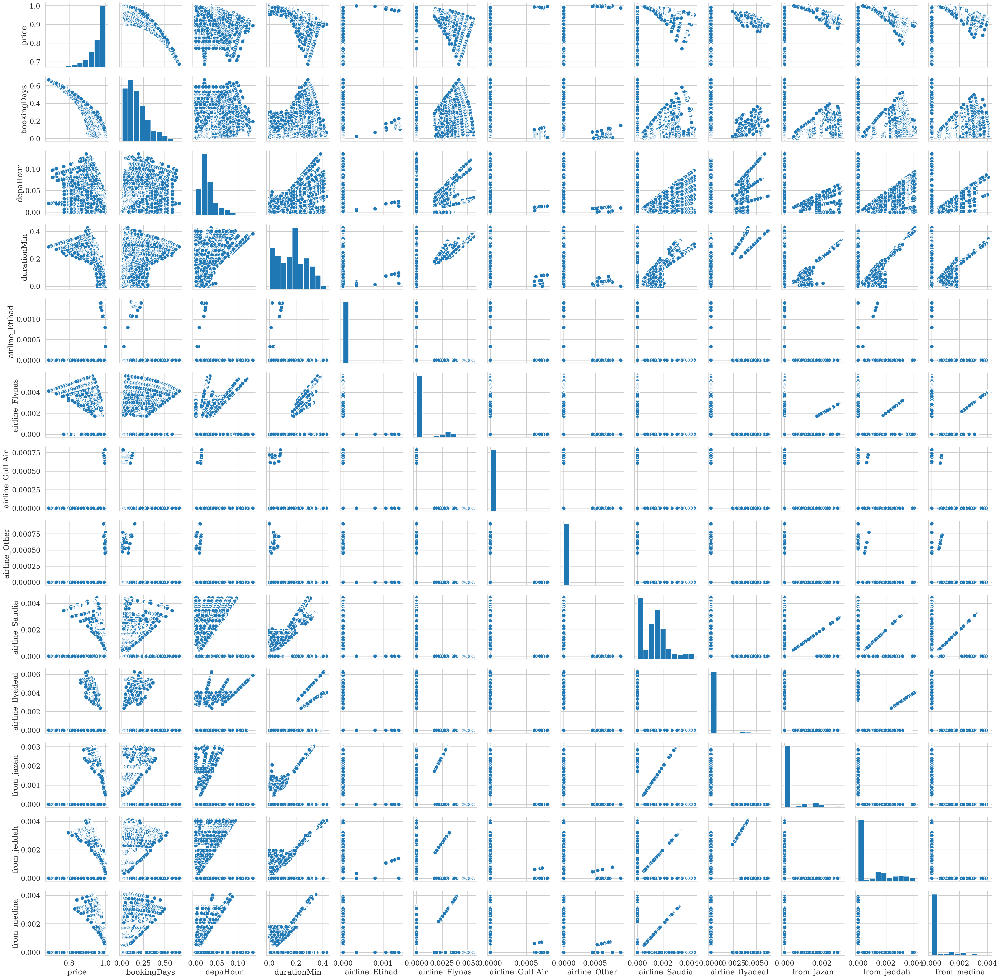

In [41]:
sns.pairplot(final_df)